# Environment

In [270]:
import os
import pandas as pd
import numpy as np
import datetime as dt
from joblib import Parallel, delayed
from plotly import express as px
import random

from optionlib.data import ticker, prices, earnings
from optionlib import *

# Load data

In [54]:
y = 2023
dte = 1

oc = pd.read_parquet(
    f'../historical_data/spx_option_chain_historical_{y}.parquet',
    filters=[('root','==','SPXW')]
)

iv_hist = pd.read_parquet(
    '../historical_data/iv_timeseries_trading_days.parquet'
)[f'IV_{dte}'].groupby('quote_datetime').mean().dropna()

iv_hist = iv_hist.reset_index().assign(
    Date = lambda x: pd.to_datetime(x.quote_datetime.dt.date)
).where(lambda x: x.quote_datetime.dt.hour.eq(10)).dropna().set_index('Date')[[f'IV_{dte}']]

spx_prices = pd.read_parquet('../historical_data/spx_price_history.parquet')

oc = oc.loc[lambda x: x.strike.between(x.underlying_ask*0.8,x.underlying_ask*1.2)]

oc = oc.assign(
    quote_datetime = lambda x: pd.to_datetime(x.quote_datetime),
    expiration = lambda x: pd.to_datetime(x.expiration),
    days_to_expiry = lambda x: (x.expiration.dt.date - x.quote_datetime.dt.date).div(np.timedelta64(1,'D')).astype(int),
    midpoint = lambda x: prices.rounded_midpoint(x.bid,x.ask,0.05),
    put_call = lambda x: x.option_type
).rename(
    columns = lambda x: x.capitalize()
).rename(
    columns = {'Option_type':'put_call'}
).set_index(['Quote_datetime','put_call','Strike'],drop = False)

oc = oc.loc[
    oc.Days_to_expiry.eq(dte) 
    & oc.Quote_datetime.dt.time.eq(dt.time(hour = 10, minute = 30)),
    ['Bid','Ask','Midpoint','Expiration','Bid_size','Ask_size']
].sort_index()

data = ticker.base_data(risk_ticker='%5ESPX',)

# Backtest

In [ ]:
max_combos = 50_000
trades = dict()
trade_quantiles = dict()
bankroll = 6e4
date_range = oc.index.get_level_values(0).unique()[::dte+1]
bankroll_hist = pd.DataFrame(index = date_range,columns = ['bankroll','contracts'])
kelly_ratio = 0.5

for dt_raw in date_range:
    print(f'{dt_raw}, ${round(bankroll,2):,}')
    dt_str = str(dt_raw.date())
    data_trunc = data.loc[:dt_str]
    price = spx_prices.loc[dt_raw].open.values[0]
    
    model_obj = model.Model(
        data_trunc.ffill(),
        horizon = dte,
        eval_date = dt_str
    )
    
    floating_quintile = floating_quantile(
            iv = iv_hist.loc[dt_str].values[0],
            y = model_obj.y,
            iv_hist = iv_hist
        )

    oc_slice = oc.loc[dt_str,:].droplevel(0)
    strikes = oc_slice.index.get_level_values('Strike')
    bounds_raw = tuple(round(i) for i in floating_quintile.agg(['min','max']).add(1).multiply(price))
    bounds = tuple(
        strikes[abs(strikes - i).argmin()] for i in bounds_raw
    )

    menu = menus.TradeMenu(
        oc_slice,
        price,
        floating_quintile,
        bounds = bounds,
        midpoint_price = True
    )
    
    menu.iron_condors(
        downsample = max_combos,
        win_pct_bounds = (0.6,0.99)
    )

    if len(menu.menu)>0:
        max_EV_harmonic_idx = menu.menu.EV_harmonic.idxmax()
    else:
        max_EV_harmonic_idx = np.nan

    if max_EV_harmonic_idx is not np.nan:
        menu_slice = menu.menu.loc[max_EV_harmonic_idx]
        trades[dt_str] = menu_slice
        trade_quantiles[dt_str] = menu.quantiles.loc[max_EV_harmonic_idx]
        
        exp_str = spx_prices.sort_index().loc[str(oc_slice.Expiration.max().date())].quote_datetime.max()
        price_close = spx_prices.loc[exp_str,'close'].values[0]
        
        payoff = (
            np.max([max_EV_harmonic_idx[1]-price_close,0])
            + np.min([price_close - max_EV_harmonic_idx[2],0])
            + np.min([max_EV_harmonic_idx[3]- price_close,0])
            + np.max([price_close- max_EV_harmonic_idx[4],0])
            - menu.menu.loc[max_EV_harmonic_idx,'cost']
        )*100
    
        contracts = min(
            np.floor(bankroll*menu_slice.kelly*kelly_ratio/(-menu_slice.max_loss)),
            20
        )
    
        bankroll += contracts * payoff
        bankroll_hist.loc[exp_str.date(),'bankroll'] = bankroll
        bankroll_hist.loc[exp_str.date(),'contracts'] = contracts
    

outcome = pd.concat(trades,axis = 1).T.assign(
    bankroll = bankroll_hist.dropna().bankroll.values,
    bankroll_delta = lambda x: x.bankroll.diff(),
    contracts = bankroll_hist.dropna().contracts.values
)

In [256]:
pd.concat(trades,axis = 1).T.assign(
    bankroll = bankroll_hist.dropna().bankroll.values,
    bankroll_delta = lambda x: x.bankroll.diff(),
    contracts = bankroll_hist.dropna().contracts.values
).to_csv('../backtest_results/2D_2023.csv')

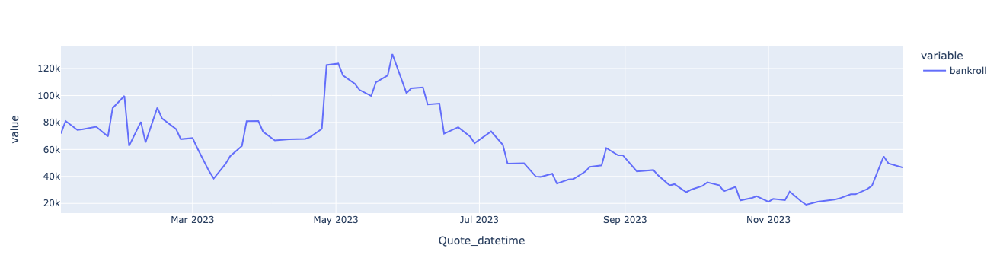

In [219]:
px.line(bankroll_hist.bankroll.dropna())

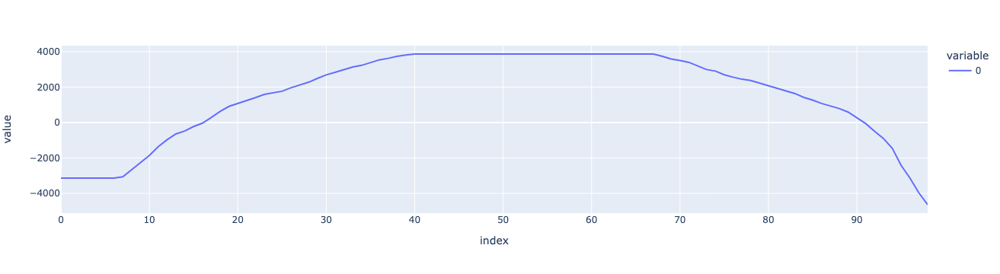

In [258]:
px.line(trade_quantiles['2023-02-01'].values)

In [264]:
price_close

4159.09

In [266]:
price_close

4070.07

In [267]:
4159.09/4070.07

1.0218718596977447

In [265]:
price_close = spx_prices.loc['2023-02-01','open'].values[0]

In [263]:
price_close = spx_prices.loc['2023-02-02','close'].values[0]

In [ ]:
exp_str = spx_prices.sort_index().loc[str(oc_slice.Expiration.max().date())].quote_datetime.max()
        price_close = spx_prices.loc[exp_str,'close'].values[0]
        
        payoff = (
            np.max([max_EV_harmonic_idx[1]-price_close,0])
            + np.min([price_close - max_EV_harmonic_idx[2],0])
            + np.min([max_EV_harmonic_idx[3]- price_close,0])
            + np.max([price_close- max_EV_harmonic_idx[4],0])
            - menu.menu.loc[max_EV_harmonic_idx,'cost']
        )*100
    
        contracts = min(
            np.floor(bankroll*menu_slice.kelly*kelly_ratio/(-menu_slice.max_loss)),
            20
        )

## Tabu search

In [261]:
model_obj = model.Model(
    data_trunc.ffill(),
    horizon = 1,
    eval_date = '2023-02-01'
)

floating_quintile = floating_quantile(
        iv = iv_hist.loc['2023-02-01'].values[0],
        y = model_obj.y,
        iv_hist = iv_hist
    )

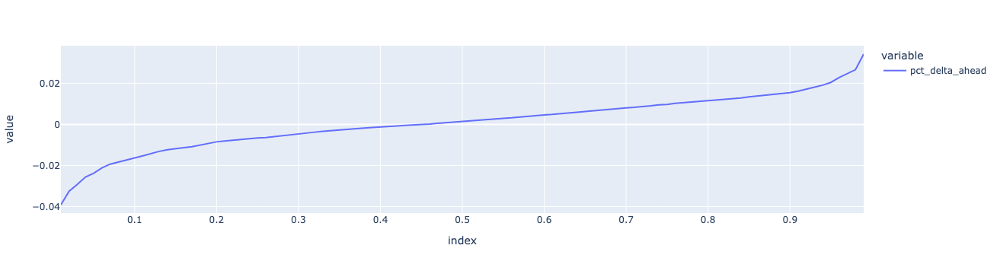

In [262]:
px.line(floating_quintile)

In [232]:
dt_raw = pd.to_datetime('2023-07-13 10:30:00')# date_range[1]

dt_str = str(dt_raw.date())
data_trunc = data.loc[:dt_str]
price = spx_prices.loc[dt_raw].open.values[0]

model_obj = model.Model(
    data_trunc.ffill(),
    horizon = 2,
    eval_date = dt_str
)

floating_quintile = floating_quantile(
        iv = iv_hist.loc[dt_str].values[0],
        y = model_obj.y,
        iv_hist = iv_hist
    )

oc_slice = oc.loc[dt_str,:].droplevel(0)
strikes = oc_slice.index.get_level_values('Strike')
bounds_raw = tuple(round(i) for i in floating_quintile.agg(['min','max']).add(1).multiply(price))
bounds = tuple(
    strikes[abs(strikes - i).argmin()] for i in bounds_raw
)

menu = menus.TradeMenu(
    oc_slice,
    price,
    floating_quintile,
    bounds = bounds,
    midpoint_price = True
)

In [455]:
menu.iron_condors(
    downsample = np.inf,
    win_pct_bounds = (0,1)
)

Calculating 70724 Iron Condors...


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 180 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 430 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 780 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 1230 tasks      | elapsed:    3.5s
[Parallel(n_jobs=-1)]: Done 1780 tasks      | elapsed:    5.0s
[Parallel(n_jobs=-1)]: Done 2430 tasks      | elapsed:    6.8s
[Parallel(n_jobs=-1)]: Done 3180 tasks      | elapsed:    8.7s
[Parallel(n_jobs=-1)]: Done 4030 tasks      | elapsed:   11.0s
[Parallel(n_jobs=-1)]: Done 4980 tasks      | elapsed:   13.5s
[Parallel(n_jobs=-1)]: Done 6030 tasks      | elapsed:   16.4s
[Parallel(n_jobs=-1)]: Done 7180 tasks      | elapsed:   19.5s
[Parallel(n_jobs=-1)]: Done 8430 tasks      | elapsed:   22.9s
[Parallel(n_jobs=-1)]: Done 9780 tasks      | elapsed:   26.6s
[Parallel(n_jobs=-1)]: Done 11230 tasks 

KeyboardInterrupt: 

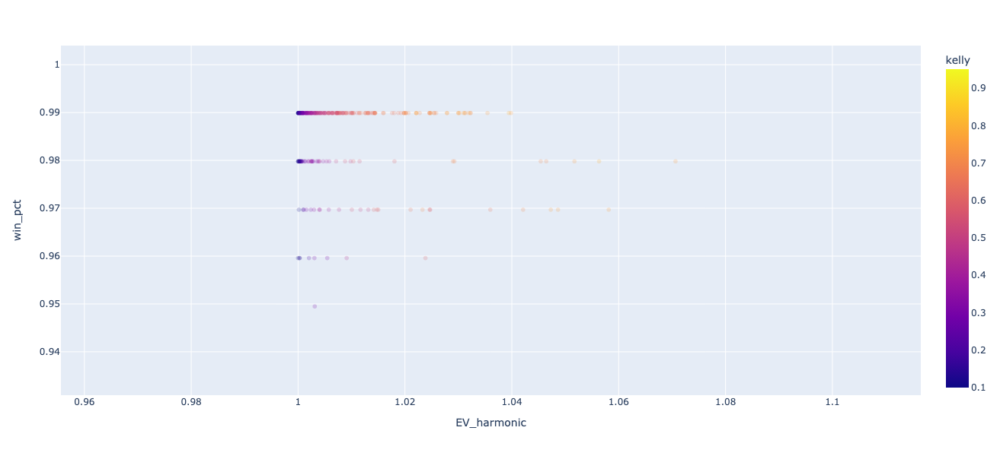

In [234]:
px.scatter(
    data_frame = menu.menu.loc['Iron condor'].reset_index(),#.sample(30000),
    x = 'EV_harmonic',
    y = 'win_pct',
    hover_data = ['leg_1','leg_2','leg_3','leg_4'],
    opacity = 0.2,
    height = 600,
    color = 'kelly'
)

In [421]:
menu_tabu = menus.TradeMenu(
    oc_slice,
    price,
    floating_quintile,
    bounds = bounds,
    midpoint_price = True
)

combos = [
    [pl,ph,cl,ch] for pl in menu_tabu.options['puts']['buy'].keys()
    for ph in menu_tabu.options['puts']['write'].keys() if ph > pl
    for cl in menu_tabu.options['calls']['write'].keys() if cl >= ph
    for ch in menu_tabu.options['calls']['buy'].keys() if ch > cl
    and menu_tabu.options['puts']['buy'][pl].price 
     + menu_tabu.options['puts']['write'][ph].price
     + menu_tabu.options['calls']['write'][cl].price 
     + menu_tabu.options['calls']['buy'][ch].price < 0
    and menu_tabu.options['puts']['buy'][pl].expected_value 
     + menu_tabu.options['puts']['write'][ph].expected_value
     + menu_tabu.options['calls']['write'][cl].expected_value 
     + menu_tabu.options['calls']['buy'][ch].expected_value > 0
]

dims = [
    list(menu_tabu.options['puts']['buy'].keys()),
    list(menu_tabu.options['puts']['write'].keys()),
    list(menu_tabu.options['calls']['write'].keys()),
    list(menu_tabu.options['calls']['buy'].keys())
]

tabu_list = list()

initial_solution_strikes = random.sample(combos,1)[0]
initial_solution = [dims[i].index(initial_solution[i]) for i in range(len(dims))]

In [448]:
def objective_function(idx):
    
    opt = options.OptionChain([
        menu.options['puts']['buy'][idx[0]],
        menu.options['puts']['write'][idx[1]],
        menu.options['calls']['write'][idx[2]],
        menu.options['calls']['buy'][idx[3]],
    ])
    return(opt.EV_harmonic,opt.win_pct)

def get_neighbors(idx):
    neighbors = list()
    for i in [1,-1]:
        for j in range(len(dims)):
            neighbor = idx[:]
            neighbor[j] += i
            neighbors.append(neighbor)
    return neighbors

def tabu_search(initial_solution, max_iterations, tabu_list_size):
    best_solution = initial_solution
    best_solution_strikes = [dims[i][best_solution[i]] for i in range(len(best_solution))]
    current_solution = initial_solution
    tabu_list = []
 
    for _ in range(max_iterations):
        neighbors = get_neighbors(current_solution)
        best_neighbor = None
        best_neighbor_strikes = None
        best_neighbor_fitness = float(-np.inf)
 
        for neighbor in neighbors:
            neighbor_strikes = [dims[i][neighbor[i]] for i in range(len(idx))]
            if neighbor not in tabu_list and neighbor_strikes in combos:
                neighbor_fitness,_ = objective_function(neighbor_strikes)
                if neighbor_fitness > best_neighbor_fitness:
                    best_neighbor = neighbor
                    best_neighbor_strikes = [dims[i][best_neighbor[i]] for i in range(len(idx))]
                    best_neighbor_fitness = neighbor_fitness
 
        if best_neighbor is None:
            print('Local maximum')
            break
 
        current_solution = best_neighbor
        tabu_list.append(best_neighbor)
        if len(tabu_list) > tabu_list_size:
            tabu_list.pop(0)
 
        if objective_function(best_neighbor_strikes) > objective_function(best_solution_strikes):
            best_solution = best_neighbor
            best_solution_strikes = [dims[i][best_solution[i]] for i in range(len(best_solution))]
 
    return best_solution_strikes, tabu_list
 

In [472]:
%%time
test, test_list = tabu_search(
    initial_solution,
    max_iterations = 10_000,
    tabu_list_size=100
)

CPU times: user 3min 5s, sys: 2.83 s, total: 3min 7s
Wall time: 3min 5s


In [473]:
test_strikes = [dims[i][test[i]] for i in range(len(idx))]

In [453]:
objective_function(test_strikes)

(9.850400925038748, 1.0)

In [454]:
test_strikes

[4340.0, 4345.0, 4375.0, 4395.0]

In [474]:
test_strikes

[4340.0, 4345.0, 4375.0, 4445.0]

In [470]:
oc_slice.unstack('put_call').loc[4340:4400]

Bid          Ask       Midpoint       Expiration             \
put_call      C     P      C     P        C     P          C          P   
Strike                                                                    
4340.0    151.6  0.15  154.9  0.20   153.25  0.15 2023-07-14 2023-07-14   
4345.0    146.5  0.15  149.9  0.25   148.15  0.20 2023-07-14 2023-07-14   
4350.0    141.1  0.15  144.9  0.25   143.00  0.20 2023-07-14 2023-07-14   
4355.0    136.5  0.15  139.9  0.25   138.15  0.20 2023-07-14 2023-07-14   
4360.0    131.5  0.20  134.9  0.25   133.15  0.20 2023-07-14 2023-07-14   
4365.0    126.6  0.20  129.9  0.25   128.25  0.20 2023-07-14 2023-07-14   
4370.0    121.5  0.20  125.0  0.30   123.25  0.25 2023-07-14 2023-07-14   
4375.0    116.6  0.25  120.0  0.30   118.30  0.25 2023-07-14 2023-07-14   
4380.0    112.5  0.25  114.0  0.30   113.25  0.25 2023-07-14 2023-07-14   
4385.0    107.6  0.25  109.0  0.35   108.30  0.25 2023-07-14 2023-07-14   
4390.0    102.6  0.30  104.0  0.35   103.30  0.30 2023-07-14 2023-07-14   
4395.0     97.6  0.30   99.0  0.40    98.25  0.30 2023-07-14 2023-07-14   
4400.0     92.6  0.35   94.1  0.45    93.30  0.40 2023-07-14 2023-07-14   

         Bid_size       Ask_size        
put_call        C     P        C     P  
Strike                                  
4340.0          3  1626       45   394  
4345.0         35  2026       45  2299  
4350.0         48  2315       45  2560  
4355.0         45  2274       45  2154  
4360.0         51   293       45  1523  
4365.0          3  1113       45   363  
4370.0         64  1979       45  2160  
4375.0         32   110       45  1921  
4380.0         20   955       20   324  
4385.0         20  2018       20  2037  
4390.0         20   712       20   649  
4395.0         20  1964       20  2006  
4400.0         20  1279       20  1939

In [475]:
opt = options.OptionChain([
        menu.options['puts']['buy'][4340.0],
        menu.options['puts']['write'][4345.0],
        menu.options['calls']['write'][4375.0],
        menu.options['calls']['buy'][4445.0],
    ])

In [476]:
opt.EV_harmonic

1.0866012041258626

In [477]:
opt.win_pct

0.1414141414141414

In [478]:
opt.price

-68.85000000000001

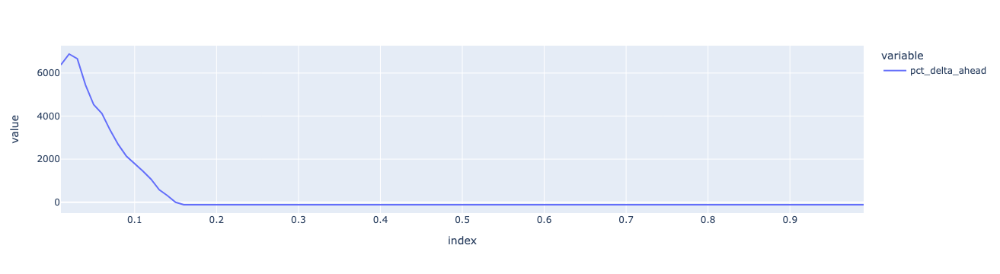

In [479]:
px.line(opt.payout)

In [458]:
menu_tabu.iron_condors(
    downsample = 10_000,
    win_pct_bounds = (0,1)
)

73,260 combinations detected, randomly downsampling to 10,000 combinations
Calculating 10000 Iron Condors...


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 180 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 430 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 780 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 1230 tasks      | elapsed:    3.4s
[Parallel(n_jobs=-1)]: Done 1780 tasks      | elapsed:    4.8s
[Parallel(n_jobs=-1)]: Done 2430 tasks      | elapsed:    6.6s
[Parallel(n_jobs=-1)]: Done 3180 tasks      | elapsed:    8.6s
[Parallel(n_jobs=-1)]: Done 4030 tasks      | elapsed:   10.9s
[Parallel(n_jobs=-1)]: Done 4980 tasks      | elapsed:   13.4s
[Parallel(n_jobs=-1)]: Done 6030 tasks      | elapsed:   16.1s
[Parallel(n_jobs=-1)]: Done 7180 tasks      | elapsed:   19.2s
[Parallel(n_jobs=-1)]: Done 8430 tasks      | elapsed:   22.5s
[Parallel(n_jobs=-1)]: Done 9780 tasks      | elapsed:   26.1s
[Parallel(n_jobs=-1)]: Done 10000 out of

Transforming output


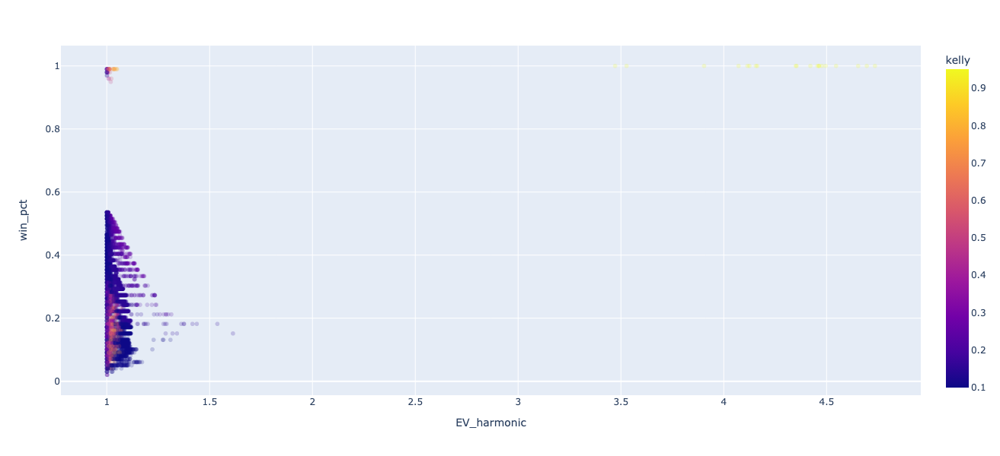

In [460]:
px.scatter(
    data_frame = menu_tabu.menu.loc['Iron condor'].reset_index(),#.sample(30000),
    x = 'EV_harmonic',
    y = 'win_pct',
    hover_data = ['leg_1','leg_2','leg_3','leg_4'],
    opacity = 0.2,
    height = 600,
    color = 'kelly'
)